In [262]:
from scipy.stats import pearsonr, gaussian_kde
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import glob
import os
import re

In [4]:
os.chdir('/home/witoslaw/diffTSS/trained_models/diffTSS')
os.getcwd()

'/home/witoslaw/diffTSS/trained_models/diffTSS'

In [315]:
results_df = pd.DataFrame(columns=['model_dir', 'architecture', 'PearsonR'], dtype=object)
model_dirs = [dir for dir in os.listdir() if re.search('20', dir)]
for model_dir in model_dirs:
    models = [file for file in os.listdir(model_dir) if re.search('.csv', file)]
    unique_architectures = set()
    for model in models:
        if re.search('fold_1_', model):
            unique_architectures.add(model)
    #print(f'Unique Architectures: {unique_architectures}')
    for unique_model in unique_architectures:
        substrings = unique_model.split('.')[1:]
        pearson_sum = 0
        for model in models:
            if all(substring in model for substring in substrings):
                #print(f'{model} has substring match for {unique_model}')
                df = pd.read_csv(f'{model_dir}/{model}')
                pearson_sum += pearsonr(df['Pred'], df['actual'])[0]
        matches = ["RNA", "transform", "K562", "GM12878"]
        architecture = ".".join([s for s in substrings if any(sub in s for sub in matches)])
        avgR = pearson_sum / (len(models) / len(unique_architectures))
        results_df.loc[len(results_df)] = [model_dir, architecture, avgR]
        #print(f'{model_dir}\t{architecture}\t{avgR}')
        results_df.sort_values(by='model_dir', inplace=True)
results_df

,model_dir,architecture,PearsonR
37,2025-04-17-00,K562,0.717061
43,2025-04-17-13,GM12878,0.754045
47,2025-04-23-15,GM12878,0.752931
46,2025-04-23-15,K562,0.717624
1,2025-04-25-14,GM12878,0.754421
6,2025-04-28-17,TrueRNA_enc.FalseRNA_emb.GM12878,0.762815
7,2025-05-01-15,TrueRNA_enc.FalseRNA_emb.log10RNA_transform.GM...,0.775775
9,2025-05-06-15,TrueRNA_enc.FalseRNA_emb.tanhRNA_transform.GM1...,0.774363
10,2025-05-06-15,TrueRNA_enc.FalseRNA_emb.log10RNA_transform.GM...,0.775040
8,2025-05-06-15,TrueRNA_enc.FalseRNA_emb.sigmoidRNA_transform....,0.767872


# Best Performance: 
- RNASeq input using stranded coverage files
    - RNA encoding with log10 transform (2025-07-31-10) OR
    - RNA one-hot with log10 and then sigmoid transform (2025-08-01-15)
    
## Stranded Coverage Files:
- K562.stranded.ENCFF336COA.ENCFF829PNJ.coverage.txt 
- GM12878.stranded.ENCFF164VLA.ENCFF074SXQ.coverage.txt

## Unstranded Coverage Files:
- K562.unstranded.ENCFF448XCV.coverage.txt
- GM12878.unstranded.ENCFF104OTO.coverage.txt
    ### (2025-07-23-11) for GM and (2025-07-25-10) for K5

---

---

In [ ]:
fold_1_opt = pd.read_csv('2025-05-28-15/fold_1_EPInformer-PE-Activity-HiC.5base.64dim.3Trans.4head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.TrueRNA_enc.FalseRNA_emb.log10RNA_transform.GM12878.CAGE_predictions.csv')
pearsonr(fold_1_opt['Pred'], fold_1_opt['actual'])

In [ ]:
K562_base = results_df[results_df['architecture'] == 'K562']
print(f"{K562_base['PearsonR'].mean()} with std: {K562_base['PearsonR'].std()}")

In [ ]:
GM12878_base = results_df[results_df['architecture'] == 'GM12878']
print(f"{GM12878_base['PearsonR'].mean()} with std: {GM12878_base['PearsonR'].std()}")

In [ ]:
GM12878_RNA = results_df[results_df['architecture'].str.contains('transform')]
print(f"{GM12878_RNA['PearsonR'].mean()} with std: {GM12878_RNA['PearsonR'].std()}")

---

---

# Functions for Correlation Plots

In [298]:
def process_model_name(model_name: str):
    base_model = model_name.split('_')[0]
    
    parts = base_model.split('-')
    model_string = []
    for part in parts:
        if part == 'epinformer':
            model_string.append('EPInformer')
        elif part == 'pe':
            model_string.append('PE')
        elif part == 'hic':
            model_string.append('HiC')
        else:
            model_string.append(part[0].upper() + part[1:])
    
    model_flags = model_name.split('_correlation_')[1]
        
    parts = model_flags.split('_')
    flags_string = []
    for part in parts:
        if part == 'gm12878':
            flags_string.append('GM12878')
        elif part == 'rna':
            flags_string.append('RNA')
        else:
            flags_string.append(part[0].upper() + part[1:])
            
        
    return ['-'.join(model_string), '-'.join(flags_string)]

In [322]:
def results(search_str: str, figname: str):
        
    model_name, model_flags = process_model_name(figname)
    
    data = pd.DataFrame()

    for file in glob.glob(search_str):
        print(file)
        df = pd.read_csv(file)
        data = pd.concat([data, df])
    
    # Initialize layout
    fig, ax = plt.subplots(figsize=(15, 10))
    
    # Density for scatterplot
    xy = np.vstack([data['Pred'], data['actual']])
    kde = gaussian_kde(xy)
    density = kde(xy)
    norm_density = (density - density.min()) / (density.max() - density.min())

    # Add scatterplot
    scatter = ax.scatter(data['Pred'], data['actual'], c=norm_density, s=60, alpha=0.7, edgecolors="k")

    ax.set_xlabel("Predicted CAGE Values (log10)")
    ax.set_ylabel("Actual CAGE Values (log10)")
    
    # Color bar for density 
    cbar = fig.colorbar(scatter, ax=ax, shrink=0.5)
    cbar.set_label('Density')

    # Fit linear regression via least squares with numpy.polyfit
    # It returns an slope (b) and intercept (a)
    # deg=1 means linear fit (i.e. polynomial of degree 1)
    b, a = np.polyfit(data['Pred'], data['actual'], deg=1)

    # Create sequence of 100 numbers from 0 to 100
    xseq = np.linspace(0, 5, num=100)

    r = pearsonr(data['Pred'], data['actual'])
    r = r[0]
    ax.text(4, 1, f'Pearson R: {r:.4f}')
    ax.set_title(f"Correlation of {model_name}: {model_flags}")
    ax.plot(xseq, a + b * xseq, color="k", lw=2.5)

    fig.savefig(f'/home/witoslaw/figures/diffTSS/{figname}.png')
    print(f"Saving figure to /home/witoslaw/figures/diffTSS/{figname}.png")
    
    
    ############### Filtering and Plotting ######################################
    
    data_filtered = data[~((data['actual'] == 0) & (data['Pred'] > .6))]
    # Initialize layout
    fig, ax = plt.subplots(figsize=(15, 10))
    
    # Density for scatterplot
    xy = np.vstack([data_filtered['Pred'], data_filtered['actual']])
    kde = gaussian_kde(xy)
    density = kde(xy)
    norm_density = (density - density.min()) / (density.max() - density.min())

    # Add scatterplot
    scatter = ax.scatter(data_filtered['Pred'], data_filtered['actual'], c=norm_density, s=60, alpha=0.7, edgecolors="k")

    ax.set_xlabel("Predicted CAGE Values (log10)")
    ax.set_ylabel("Actual CAGE Values (log10)")
    
    # Color bar for density 
    cbar = fig.colorbar(scatter, ax=ax, shrink=0.5)
    cbar.set_label('Density')

    # Fit linear regression via least squares with numpy.polyfit
    # It returns an slope (b) and intercept (a)
    # deg=1 means linear fit (i.e. polynomial of degree 1)
    b, a = np.polyfit(data_filtered['Pred'], data_filtered['actual'], deg=1)

    # Create sequence of 100 numbers from 0 to 100
    xseq = np.linspace(0, 5, num=100)

    r = pearsonr(data_filtered['Pred'], data_filtered['actual'])
    r = r[0]
    ax.text(4, 1, f'Pearson R: {r:.4f}')
    ax.set_title(f"Filtered Correlation of {model_name}: {model_flags}")
    ax.plot(xseq, a + b * xseq, color="k", lw=2.5)
    
    filtered_figname = figname.replace('correlation', 'filtered_correlation')
    fig.savefig(f'/home/witoslaw/figures/diffTSS/{filtered_figname}.png')
    print(f"Saving figure to /home/witoslaw/figures/diffTSS/{filtered_figname}.png")

# Correlation Plots for Performance of EPInformer-PE-Activity-HiC Model

## *** All filtered plots exclude datapoints where Actual = 0 and Pred > .6 (addressing issue in Ground Truth data: NA vs True 0)

## Plotting Correlation for Model Using Base Encoder and No RNA-Seq -> 2025-10-06-16 : slurm-60334

2025-10-06-16/fold_1_EPInformer-PE-Activity-HiC.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-06-16/fold_2_EPInformer-PE-Activity-HiC.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-06-16/fold_3_EPInformer-PE-Activity-HiC.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-06-16/fold_4_EPInformer-PE-Activity-HiC.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-06-16/fold_5_EPInformer-PE-Activity-HiC.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-06-16/fold_6_EPInformer-PE-Activity-HiC.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predicti

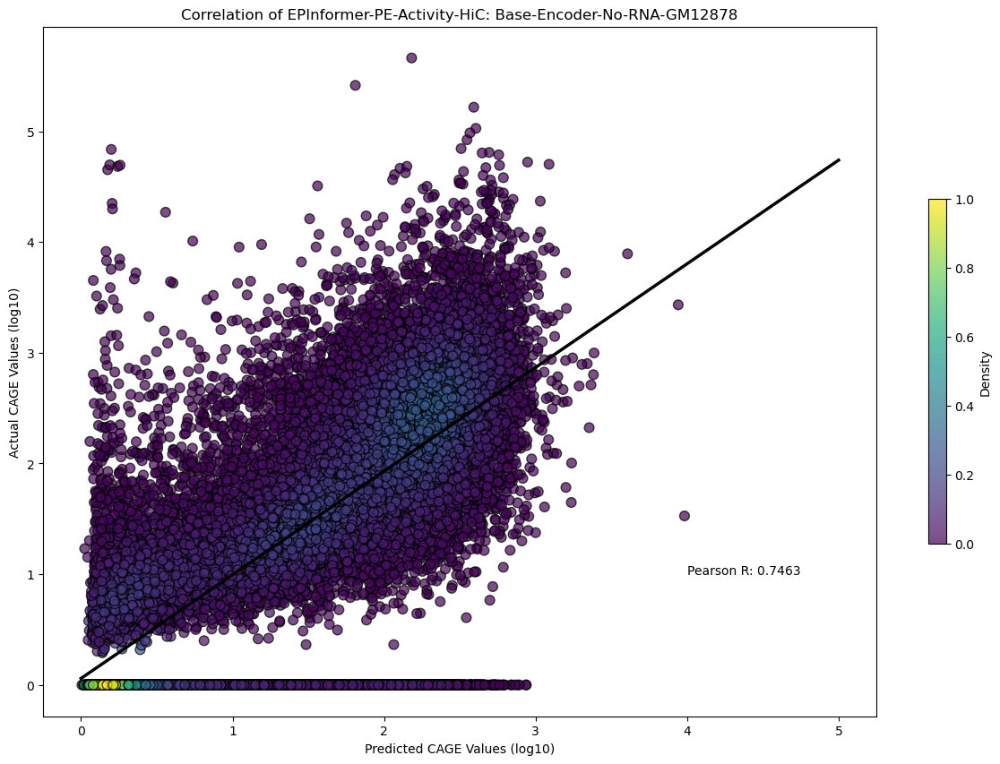

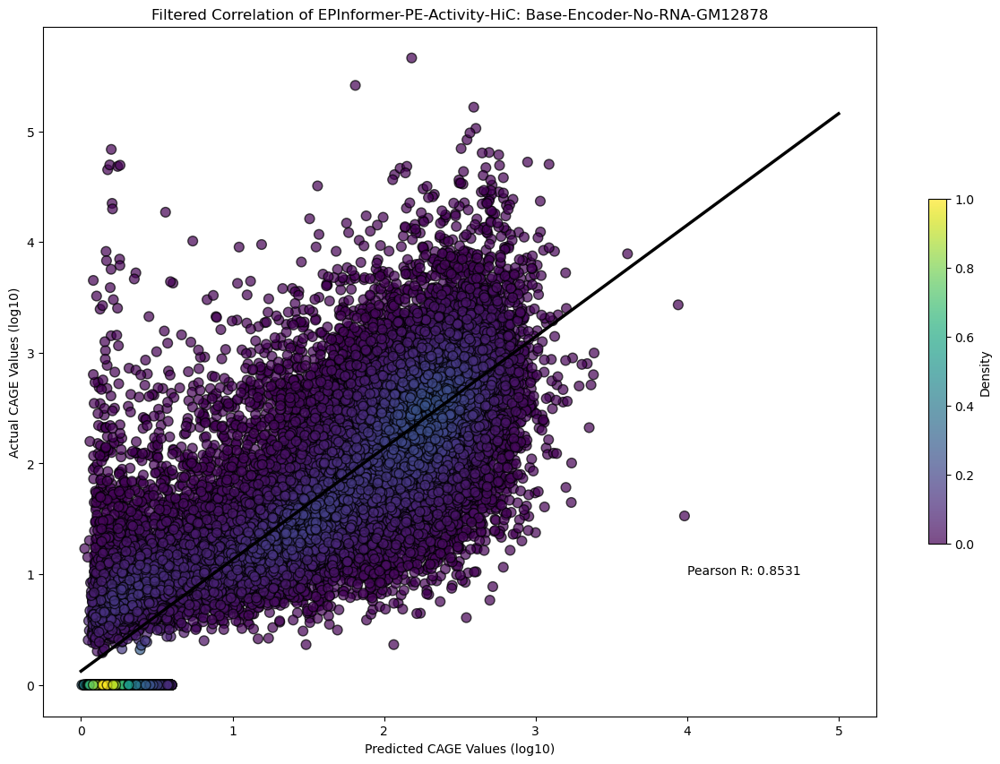

In [323]:
results('2025-10-06-16/fold*GM12878*csv', 'epinformer-pe-activity-hic_correlation_base_encoder_no_rna_gm12878')

## Plotting Correlation for Model Using Pre-Trained Encoder and No RNA-Seq -> 2025-04-23-15	

2025-04-23-15/fold_5_EPInformer-PE-Activity-HiC.preTrainedConv.4base.64dim.3Trans.4head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.GM12878.CAGE_predictions.csv
2025-04-23-15/fold_6_EPInformer-PE-Activity-HiC.preTrainedConv.4base.64dim.3Trans.4head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.GM12878.CAGE_predictions.csv
2025-04-23-15/fold_7_EPInformer-PE-Activity-HiC.preTrainedConv.4base.64dim.3Trans.4head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.GM12878.CAGE_predictions.csv
2025-04-23-15/fold_3_EPInformer-PE-Activity-HiC.preTrainedConv.4base.64dim.3Trans.4head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.GM12878.CAGE_predictions.csv
2025-04-23-15/fold_4_EPInformer-PE-Activity-HiC.preTrainedConv.4base.64dim.3Trans.4head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.GM12878.CAGE_predictions.csv
2025-04-23-15/fold_8_EPInformer-PE-Activity-HiC.preTrainedConv.4base.64dim.3Trans.4head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.GM12878.CAGE_predictions.csv
2025-04-23-15/fold_9_EPInformer-PE-Activity-HiC.preTrained

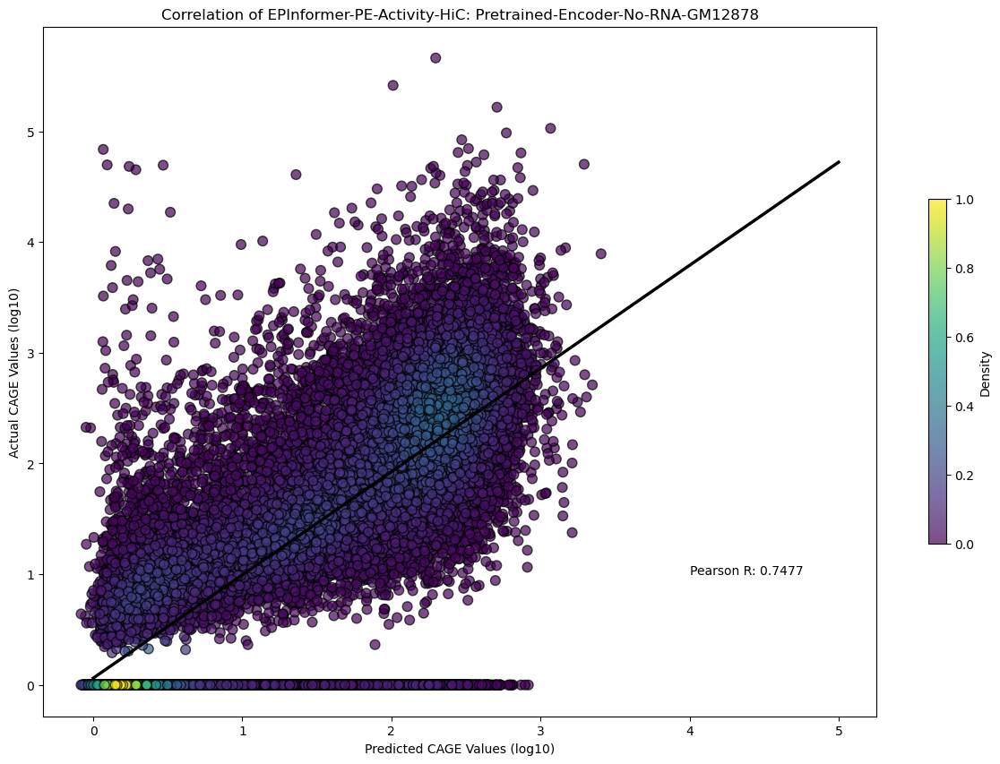

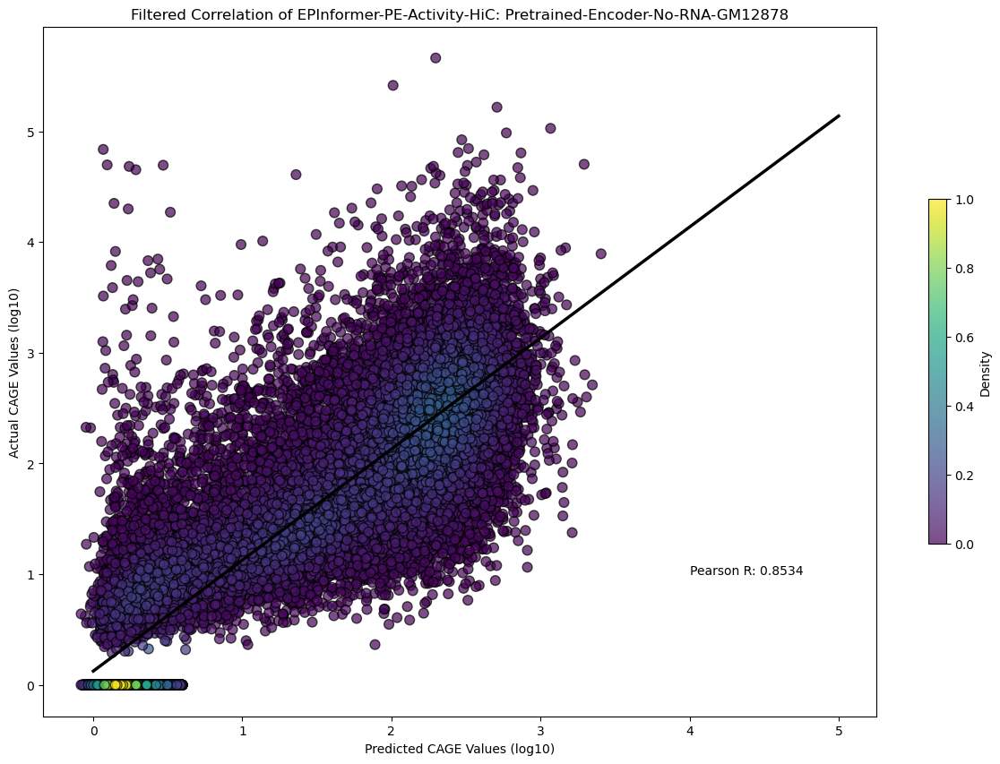

In [324]:
results('2025-04-23-15/fold*GM12878*csv', 'epinformer-pe-activity-hic_correlation_pretrained_encoder_no_rna_gm12878')

## Plotting Correlation for Model Using Pre-Trained Encoder and RNA Embedding -> 2025-09-25-12	

2025-09-25-12/fold_1_EPInformer-PE-Activity-HiC.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.embeddingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-09-25-12/fold_2_EPInformer-PE-Activity-HiC.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.embeddingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-09-25-12/fold_3_EPInformer-PE-Activity-HiC.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.embeddingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-09-25-12/fold_4_EPInformer-PE-Activity-HiC.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.embeddingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-09-25-12/fold_5_EPInformer-PE-Activity-HiC.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.embeddingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-09-25-12/fold_6_EPInformer-PE-Activity-HiC.preTrai

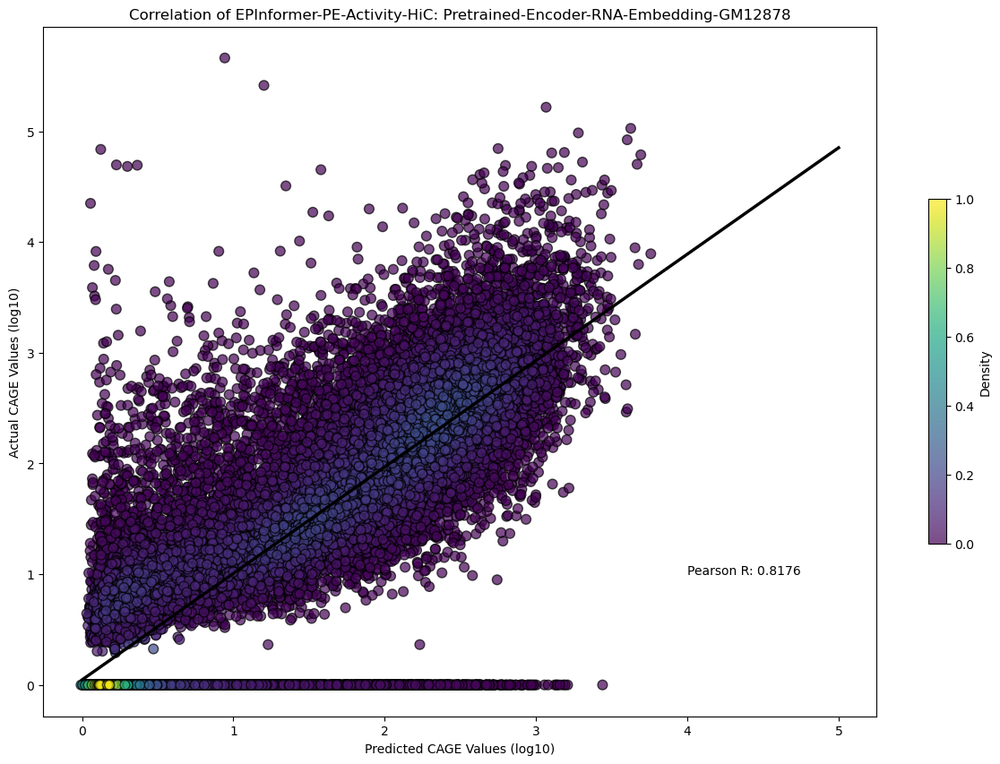

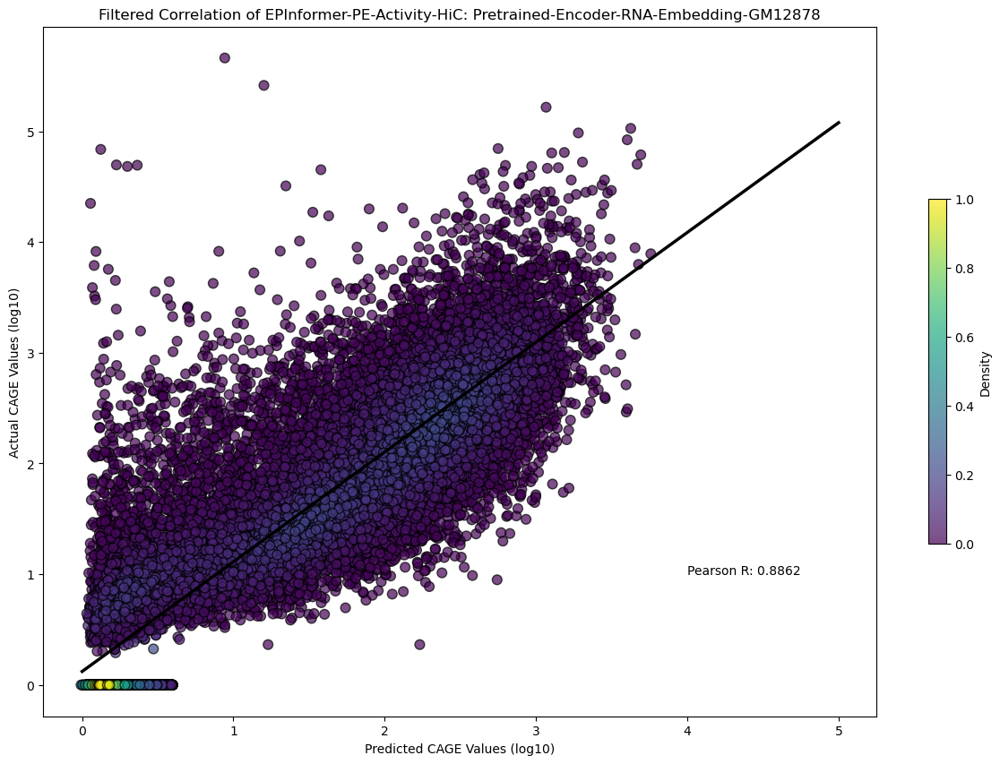

In [325]:
results('2025-09-25-12/fold*csv', 'epinformer-pe-activity-hic_correlation_pretrained_encoder_rna_embedding_gm12878')

## Plotting Correlation for Best Performing Model -> 2025-08-11-10 : RNA encoding, GM12878

2025-08-11-10/fold_1_EPInformer-PE-Activity-HiC.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.encodingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-08-11-10/fold_2_EPInformer-PE-Activity-HiC.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.encodingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-08-11-10/fold_3_EPInformer-PE-Activity-HiC.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.encodingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-08-11-10/fold_4_EPInformer-PE-Activity-HiC.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.encodingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-08-11-10/fold_5_EPInformer-PE-Activity-HiC.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.encodingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-08-11-10/fold_6_EPInformer-PE-Activity-HiC.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.3extraFeat.60enh.encodingRNA.log10RNA_t

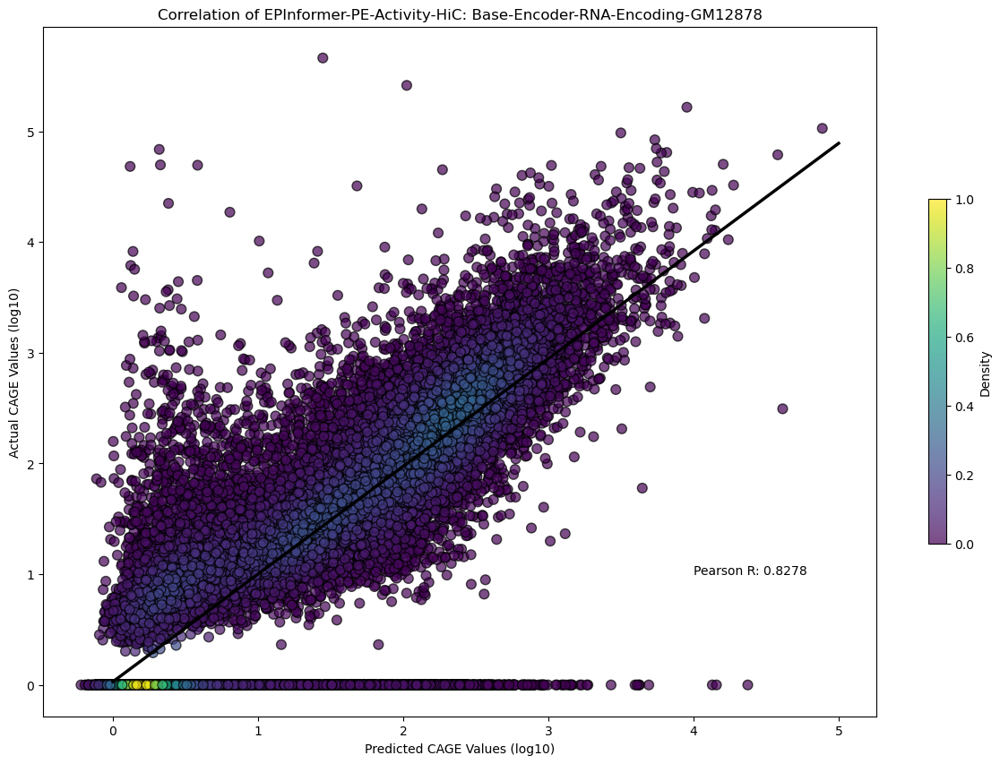

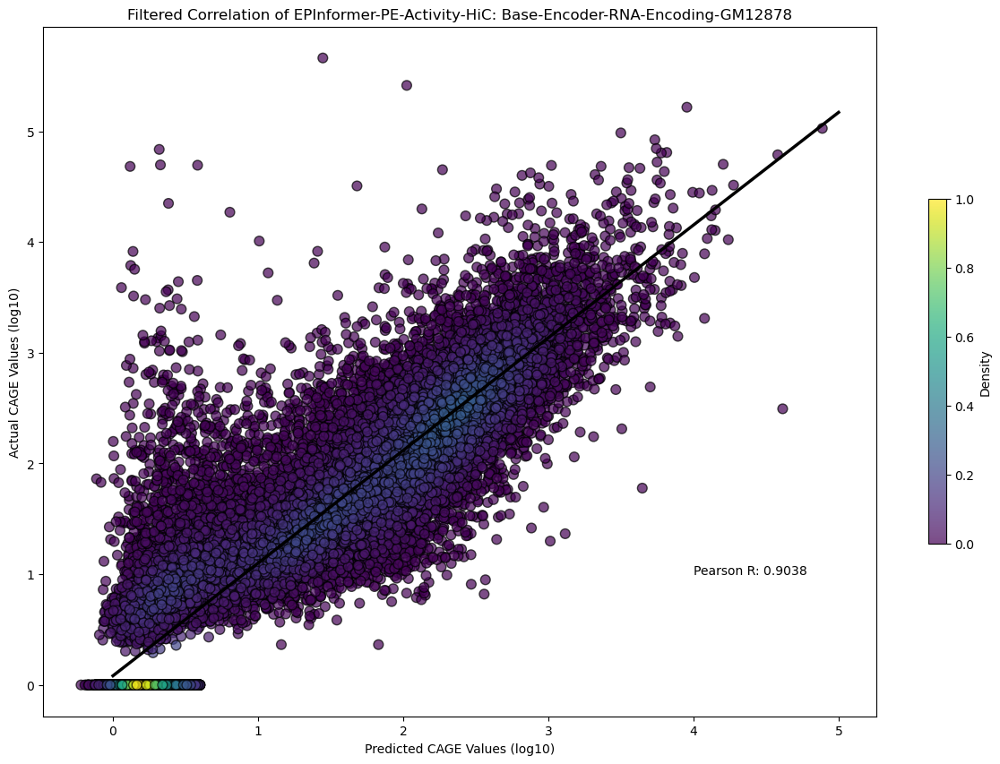

In [326]:
results('2025-08-11-10/fold*csv', 'epinformer-pe-activity-hic_correlation_base_encoder_rna_encoding_gm12878')

# Correlation Plots for Performance of EPInformer-PE Model

## *** All filtered plots exclude datapoints where Actual = 0 and Pred > .6 (addressing issue in Ground Truth data: NA vs True 0)

## Plotting Correlation for Model Using Base Encoder and no RNA -> 2025-10-04-20 : slurm-60294

2025-10-04-20/fold_1_EPInformer-PE.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-04-20/fold_2_EPInformer-PE.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-04-20/fold_3_EPInformer-PE.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-04-20/fold_4_EPInformer-PE.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-04-20/fold_5_EPInformer-PE.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-04-20/fold_6_EPInformer-PE.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-04-20/fold_7_EPInformer-PE.4base.64dim.3Trans.8head.TrueBN.Tru

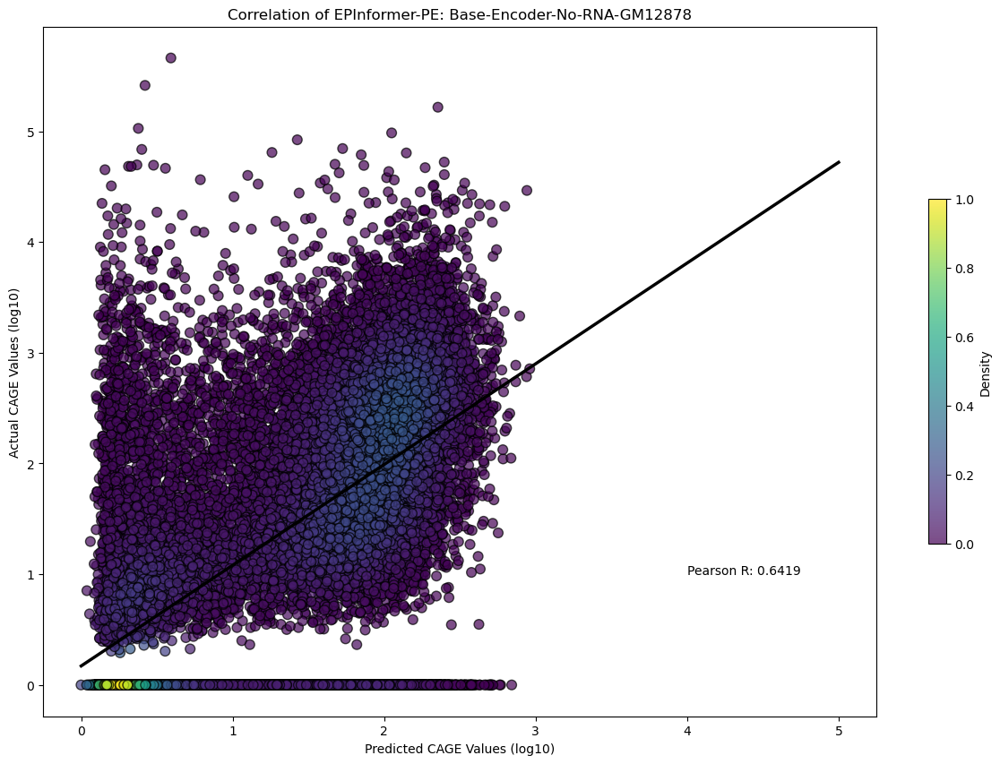

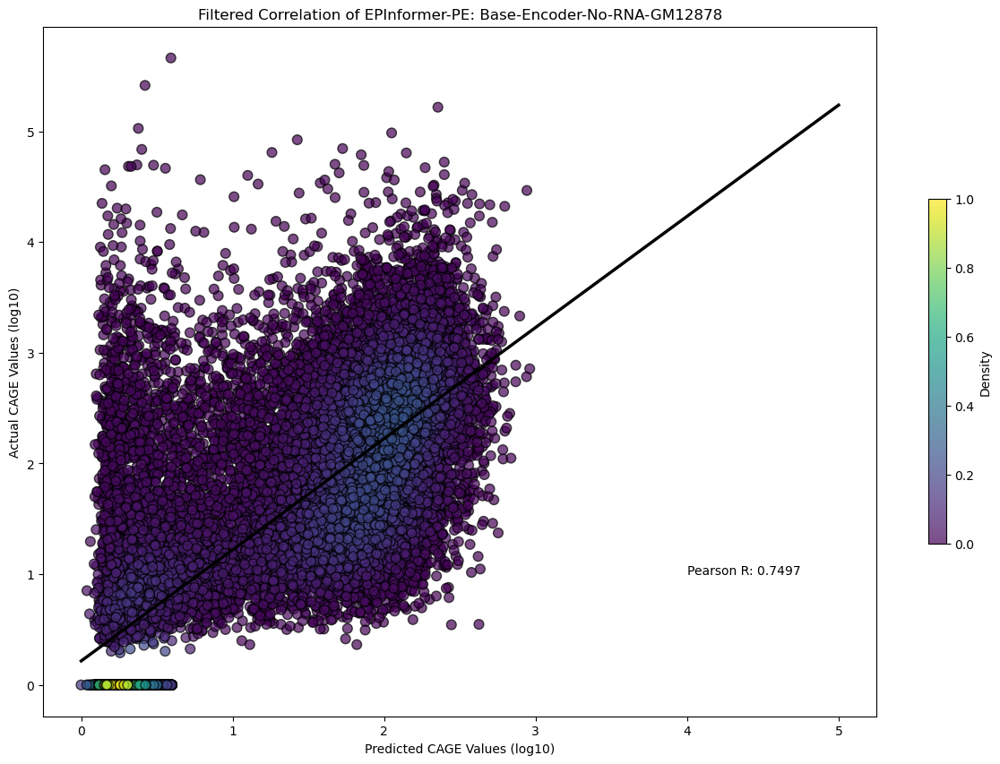

In [327]:
results('2025-10-04-20/fold*EPInformer-PE.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv',
        'epinformer-pe_correlation_base_encoder_no_rna_gm12878')

## Plotting Correlation for Model Using Pre-Trained Encoder and no RNA-> 2025-10-05-20 : slurm-60302

2025-10-05-20/fold_1_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-05-20/fold_2_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-05-20/fold_3_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-05-20/fold_4_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-05-20/fold_5_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.CAGE_predictions.csv
2025-10-05-20/fold_6_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.NoneRNA.NoneRNA_transform.GM12878.C

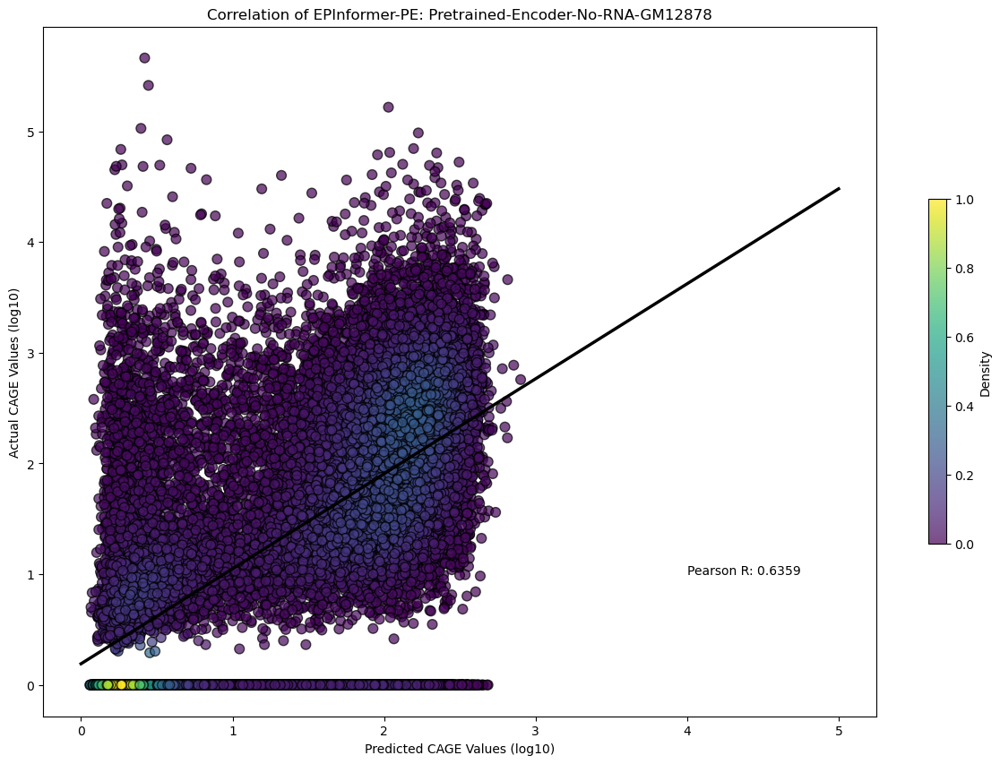

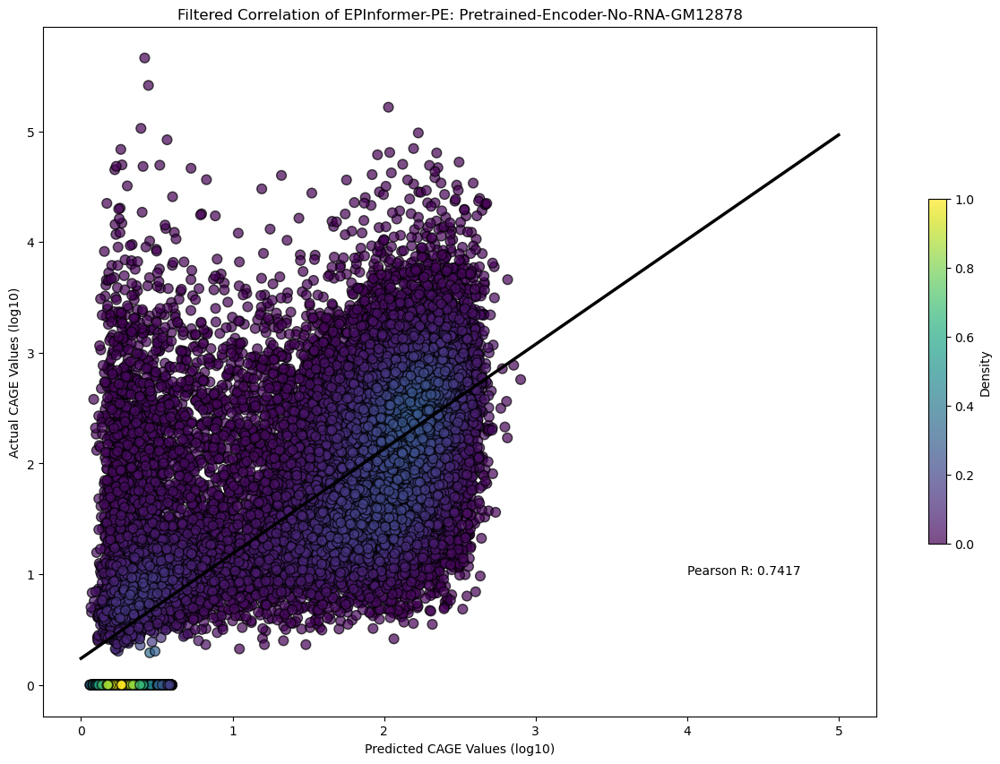

In [328]:
results('2025-10-05-20/fold*csv', 'epinformer-pe_correlation_pretrained_encoder_no_rna_gm12878')

## Plotting Correlation for Model Using Pre-Trained Encoder and RNA Embedding -> 2025-10-04-20 : slurm-60289

2025-10-04-20/fold_1_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.embeddingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-10-04-20/fold_2_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.embeddingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-10-04-20/fold_3_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.embeddingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-10-04-20/fold_4_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.embeddingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-10-04-20/fold_5_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.embeddingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-10-04-20/fold_6_EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.embed

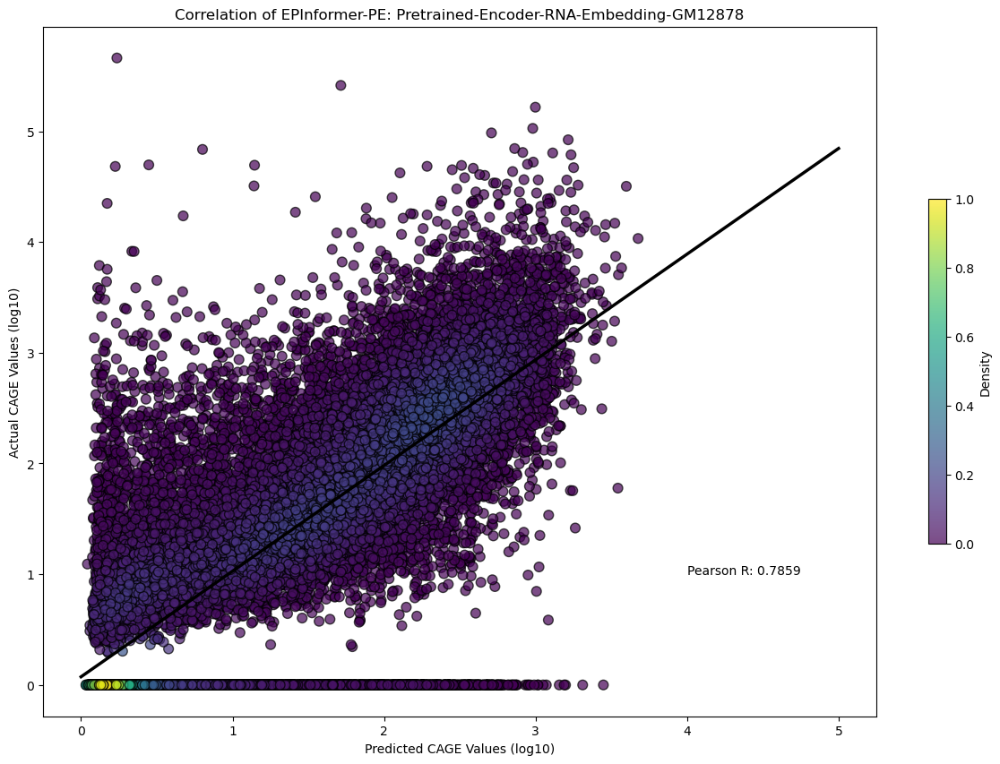

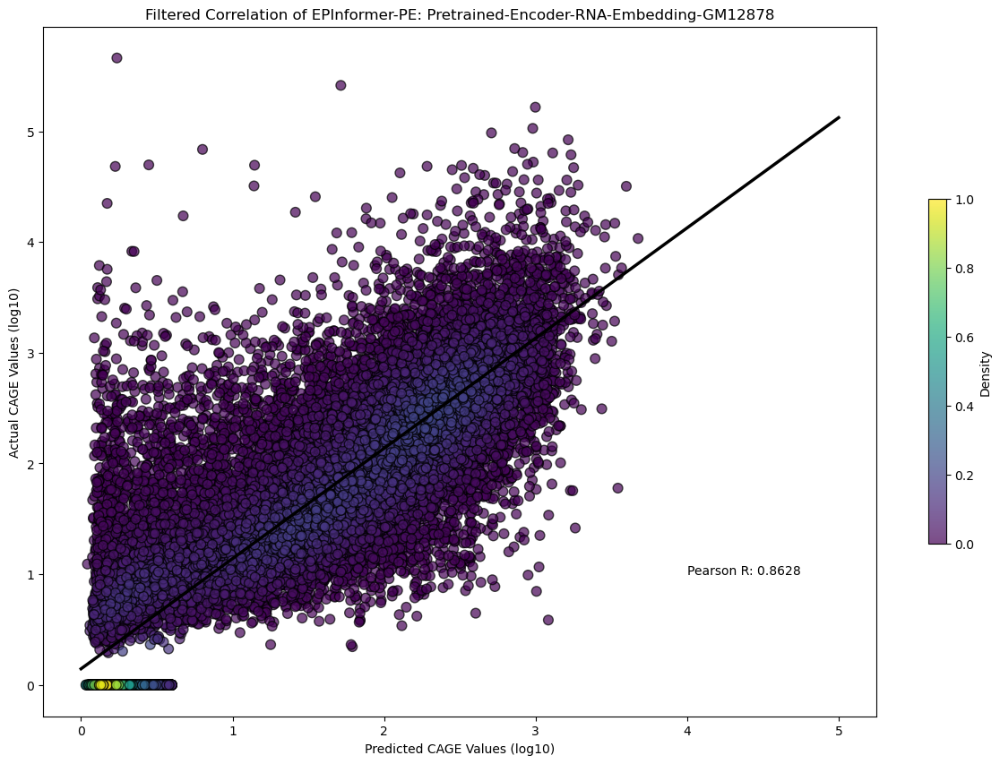

In [329]:
results('2025-10-04-20/fold*EPInformer-PE.preTrainedConv.4base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.embeddingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv',
        'epinformer-pe_correlation_pretrained_encoder_rna_embedding_gm12878')

## Plotting Correlation for Model Using Base Encoder and RNA Encoding -> 2025-10-06-15 : slurm-60332

2025-10-06-15/fold_1_EPInformer-PE.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.encodingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-10-06-15/fold_2_EPInformer-PE.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.encodingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-10-06-15/fold_3_EPInformer-PE.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.encodingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-10-06-15/fold_4_EPInformer-PE.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.encodingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-10-06-15/fold_5_EPInformer-PE.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.encodingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-10-06-15/fold_6_EPInformer-PE.5base.64dim.3Trans.8head.TrueBN.TrueLN.TrueFeat.1extraFeat.60enh.encodingRNA.log10RNA_transform.GM12878.CAGE_predictions.csv
2025-10-06-15/fold_7_EPInformer-PE.5base

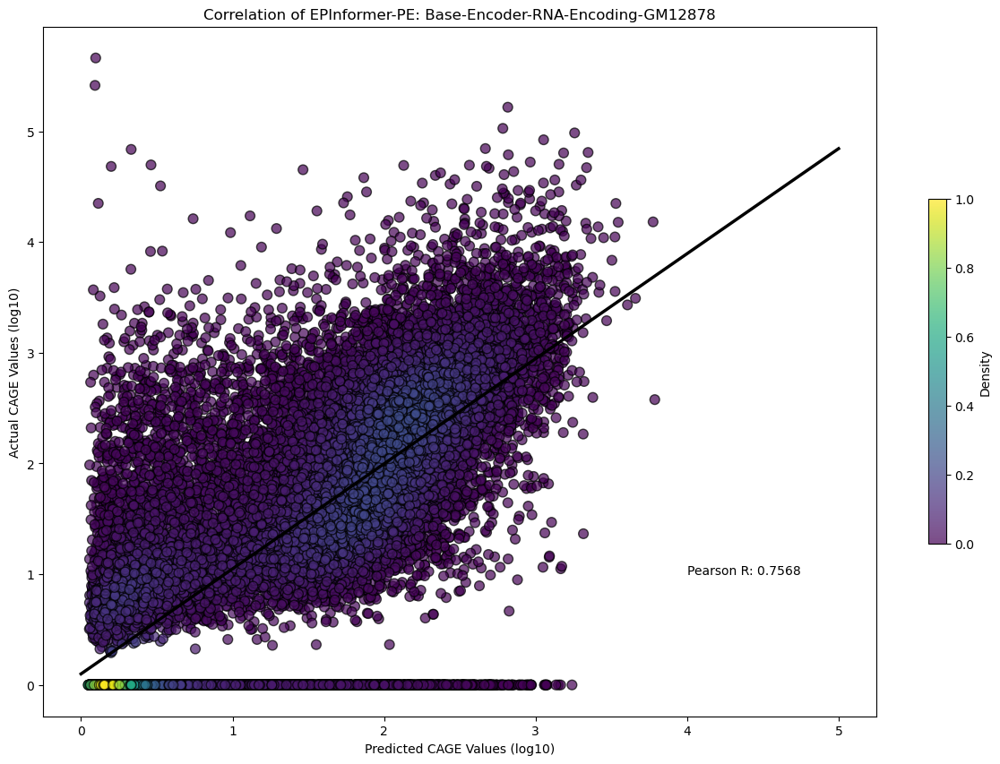

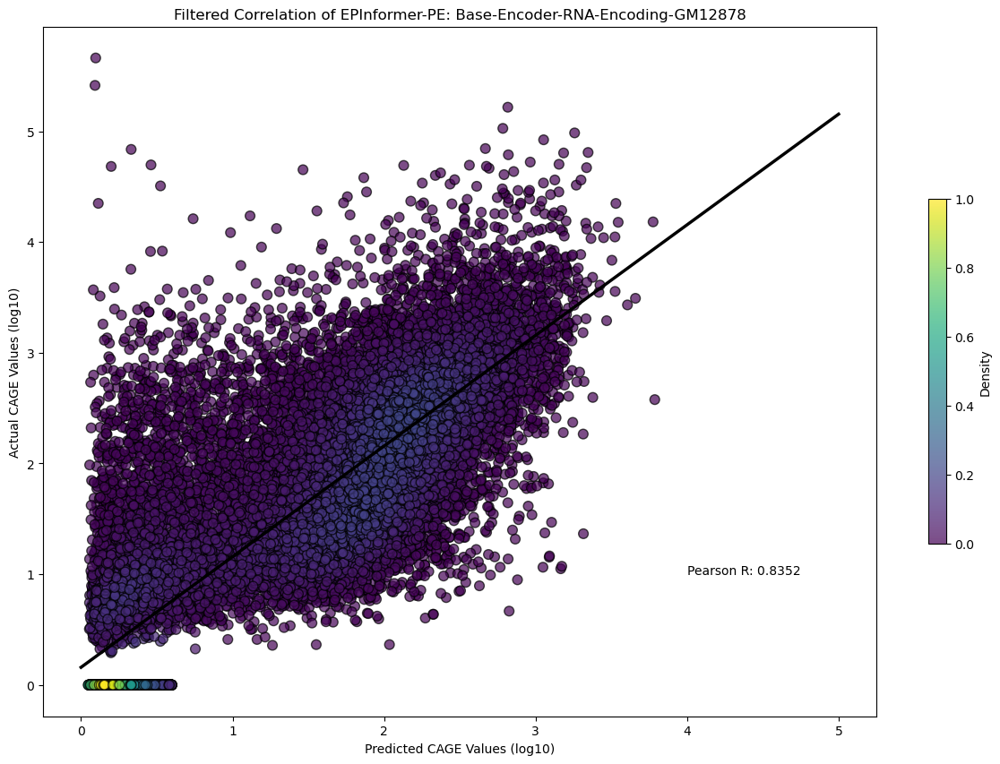

In [330]:
results('2025-10-06-15/fold*csv', 'epinformer-pe_correlation_base_encoder_rna_encoding_gm12878')